## Методические указания по выполнению лабораторной работы №4

**Тема: Сегментация объектов с использованием Mask R-CNN**

**Цель работы:** Познакомиться с архитектурой Mask R-CNN и научиться выполнять сегментацию объектов на изображениях.

**Задачи:**

- Изучить теоретические основы instance segmentation.
- Ознакомиться с архитектурой Mask R-CNN.
- Провести инференс предобученной модели на выбранных изображениях.
- Визуализировать результаты: bounding boxes, маски объектов.
- Рассчитать метрики оценки качества масок.
- Проанализировать ошибки сегментации.
- Провести исследование зависимости качества от параметров confidence score и mask threshold.

### 1. Теоретическая часть

В данной лабораторной работе мы познакомимся с задачей детекции на примере архитектуры [Mask R-CNN](https://arxiv.org/pdf/1703.06870), обученной на наборе данных [COCO](https://cocodataset.org/#home), а также с новой задачей компьютерного зрения - сегментацией.

**Перед тем, как приступать к выполнению практической части, ознакомьтесь с первоисточниками используемых компонентов, а также документацией по [ссылке](https://pytorch.org/vision/main/models/mask_rcnn.html), включающей подробности работы с моделью и новым форматом данных, сэмплы кода.**

#### 1.1 Instance Segmentation и архитектура Mask R-CNN

Instance segmentation — это задача, в которой необходимо не только обнаружить объект и его класс, но и сегментировать его границы на уровне пикселей. Это усложнённая версия задачи детекции, так как bounding box не всегда точно соответствует форме объекта.

В отличие от semantic segmentation, где модель выдает одну маску на класс, в instance segmentation выделяется каждый объект независимо, даже если они относятся к одному классу.

Mask R-CNN — это расширение Faster R-CNN, дополненное ещё одним выходом: бинарной маской для каждого обнаруженного объекта.

Архитектура Mask R-CNN включает:

1. Backbone (например, ResNet-50) — извлекает карты признаков из изображения.
2. Region Proposal Network (RPN) — предлагает кандидаты на объекты.
3. ROI Align / ROI Pooling — извлекает фиксированные области из фичей.
4. Bounding Box Head — классифицирует объект и уточняет координаты.
5. Mask Head — предсказывает маску для каждого класса, соответствующую bounding box.


#### 1.2 Формат данных для задачи детекции

При запуске инференса модель возвращает словарь с результатами: координаты bounding boxes, классы объектов, confidence score и маски объектов (представлены как float значения от 0 до 1).

В рамках выполнения работы в зависимости от варианта вам предстоит познакомиться с другими форматами файлов и их содержимым.

### Варианты

Выполните задание в соответствии со своим вариантом по списку с использованием предобученной модели.

**Вариант 1  - Pascal VOC 2007. Сравнить предсказания модели с реальной разметкой и провести количественную оценку:**

- Выполнить инференс модели на 20 изображениях;
- Визуализировать bounding boxes и маски;
- Проанализировать качество предсказаний;
- Описать, какие классы модель распознала, какие пропустила.

**Вариант 2 — COCO 2017. Сравнить предсказания модели с реальной разметкой и провести количественную оценку:**

- Выполнить инференс на 20 изображениях;
- Визуализировать предсказания;
- Сравнить полученные маски с ground truth;
- Рассчитать IoU, Pixel Accuracy или Precision/Recall;

**Вариант 3 — Cityscapes. Проверить, как модель работает на новых изображениях, визуализировать предсказания и сравнить с известными аннотациями:**

- Выполнить инференс на 20 изображениях;
- Визуализировать предсказания;
- Сравнить полученные маски с ground truth;
- Рассчитать IoU, Pixel Accuracy или Precision/Recall;


### 2. Практическая часть

#### 2.1 Подготовка окружения

Установите зависимости и библиотеки:

In [1]:
import torch
import torchvision
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.datasets import Cityscapes
from torchvision import transforms
from torchvision.transforms import functional as F
from PIL import Image
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
from tqdm import tqdm
from matplotlib.patches import Rectangle

#### 2.2 Подготовка модели

Загрузите предобученную модель, определите устройство, переведите модель в режим инференса:

In [2]:
# импорт модели
# Определение устройства для вычислений (GPU, если доступен, иначе CPU)
# torch.cuda.is_available() проверяет наличие CUDA-совместимой видеокарты
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Создание модели Mask R-CNN с ResNet-50 и FPN (Feature Pyramid Network) в качестве backbone
# weights="DEFAULT" загружает предобученные веса по умолчанию для этой архитектуры
model = maskrcnn_resnet50_fpn(weights="DEFAULT")

# Перенос модели на выбранное устройство (GPU или CPU)
# .to(device) перемещает модель на указанное устройство
# .eval() переводит модель в режим инференса (отключает dropout и batch normalization)
model.to(device).eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

#### 2.3 Загрузка и предобработка изображений


Затем импортируйте датасет из соответствующих пакетов PyTorch и определите метод трансформации данных для подачи в модель:

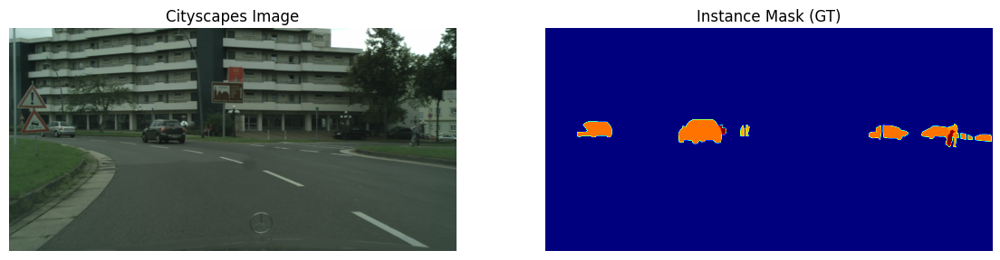

In [3]:
# Импорт библиотеки для визуализации данных
import matplotlib.pyplot as plt
# Импорт библиотеки для работы с массивами
import numpy as np
# Импорт библиотеки для работы с изображениями
from PIL import Image
# Предполагается, что F (torchvision.transforms.functional) и Cityscapes уже импортированы

# Указываем путь к корневой директории датасета Cityscapes
root = "./Cityscapes"

# Функция для преобразования изображения и масок
def cityscapes_transform(image, target):
    # Конвертируем изображение в тензор PyTorch и нормализуем значения пикселей в [0, 1]
    image = F.to_tensor(image)
    # Возвращаем преобразованное изображение и целевые маски (без изменений)
    return image, target
    
# Создаем объект датасета Cityscapes
dataset = Cityscapes(
    root=root,          # Путь к данным
    split="train",      # Используем тренировочную часть датасета
    mode="fine",        # Используем "fine" аннотации (детализированные)
    target_type="instance",  # Загружаем маски экземпляров объектов
    transforms=cityscapes_transform  # Применяем наше преобразование
)

# Получаем первое изображение и соответствующую маску из датасета
img, gt_mask = dataset[0]

# Преобразуем тензорное изображение в numpy массив и меняем порядок осей (C,H,W) -> (H,W,C)
img_np = img.permute(1, 2, 0).numpy()
# Нормализуем изображение к диапазону [0, 1] (защита от деления на 0 через 1e-5)
img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-5)

# Конвертируем маску (тензор) в numpy массив
gt_mask_np = np.array(gt_mask)

# Создаем фигуру для визуализации размером 14x6 дюймов
plt.figure(figsize=(14, 6))

# Первый сабплот (1 строка, 2 столбца, позиция 1)
plt.subplot(1, 2, 1)
# Устанавливаем заголовок
plt.title("Cityscapes Image")
# Отображаем изображение
plt.imshow(img_np)
# Отключаем оси
plt.axis("off")

# Второй сабплот (1 строка, 2 столбца, позиция 2)
plt.subplot(1, 2, 2)
plt.title("Instance Mask (GT)")  # GT = Ground Truth (истинные значения)
# Отображаем маску с цветовой картой 'jet'
plt.imshow(gt_mask_np, cmap='jet')
plt.axis("off")

# Показываем визуализацию
plt.show()

#### 2.4 Предсказания и извлечение масок

Если вы работаете с Pascal VOC, вам потребуется прочитать файлы, содержащие разметку. Если вы работаете с COCO или Cityscapes, аннотации читаются через готовые методы COCO API:

In [4]:
# Список названий классов объектов для датасета COCO (91 категория)
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
    'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant',
    'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog',
    'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe',
    'N/A', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
    'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat',
    'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot',
    'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant',
    'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
    'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink',
    'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
    'hair drier', 'toothbrush'
]

def visualize_all(img_tensor, prediction, gt_mask_instance, confidence_threshold=0.5, mask_threshold=0.5):
    """
    Визуализирует:
    1. Исходное изображение с bbox и названиями классов
    2. Предсказанные маски
    3. Ground Truth instance маску
    """
    # Конвертируем тензор изображения в numpy массив и меняем порядок каналов
    img = img_tensor.cpu().permute(1, 2, 0).numpy()
    # Нормализуем изображение к диапазону [0, 1]
    img = (img - img.min()) / (img.max() - img.min() + 1e-5)

    # Создаем копию изображения для рисования bounding box'ов
    img_with_boxes = img.copy()
    # Создаем фигуру с 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Первый subplot: исходное изображение с bounding box'ами
    axes[0].imshow(img_with_boxes)
    # Рисуем bounding box'ы и подписи классов
    for box, label, score in zip(prediction['boxes'], prediction['labels'], prediction['scores']):
        # Пропускаем предсказания с низкой уверенностью
        if score < confidence_threshold:
            continue
        # Конвертируем координаты box'а в numpy
        box = box.detach().cpu().numpy()
        # Получаем целочисленный label
        label = int(label)
        # Получаем название класса из списка COCO
        name = COCO_INSTANCE_CATEGORY_NAMES[label] if label < len(COCO_INSTANCE_CATEGORY_NAMES) else "N/A"

        # Рисуем прямоугольник (bounding box)
        axes[0].add_patch(Rectangle(
            (box[0], box[1]),
            box[2] - box[0],  # ширина
            box[3] - box[1],  # высота
            linewidth=2, edgecolor='red', facecolor='none'))

        # Добавляем текст с названием класса и score
        axes[0].text(box[0], box[1] - 5, f"{name} {score:.2f}",
                     color='white', fontsize=8,
                     bbox=dict(facecolor='red', alpha=0.5))

    axes[0].set_title("Image with BBox + Class")
    axes[0].axis("off")

    # Второй subplot: предсказанные маски
    pred_masks = prediction['masks']
    # Создаем пустую маску для суммирования всех предсказанных масок
    mask_sum = np.zeros_like(gt_mask_instance, dtype=np.float32)
    for i in range(len(pred_masks)):
        # Пропускаем маски с низкой уверенностью
        if prediction['scores'][i] < confidence_threshold:
            continue
        # Получаем маску и конвертируем в numpy
        mask = pred_masks[i, 0].detach().cpu().numpy()
        # Бинаризуем маску по порогу
        mask_bin = (mask > mask_threshold).astype(np.float32)
        # Добавляем к общей маске
        mask_sum += mask_bin

    # Отображаем изображение и маски поверх него
    axes[1].imshow(img)
    axes[1].imshow(mask_sum > 0, alpha=0.5, cmap="jet")
    axes[1].set_title("Predicted Masks")
    axes[1].axis("off")

    # Третий subplot: Ground Truth маски
    axes[2].imshow(gt_mask_instance, cmap='jet')
    axes[2].set_title("Ground Truth Instance Mask")
    axes[2].axis("off")

    # Улучшаем расположение subplots
    plt.tight_layout()
    plt.show()

def calculate_iou(pred_mask, gt_mask):
    """Вычисляет Intersection over Union (IoU) между двумя бинарными масками"""
    # Вычисляем пересечение масок
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    # Вычисляем объединение масок
    union = np.logical_or(pred_mask, gt_mask).sum()
    # Защита от деления на ноль
    if union == 0:
        return 0.0
    # Возвращаем IoU
    return intersection / union

def calculate_fp_fn(pred_mask, gt_mask):
    """Вычисляет False Positives и False Negatives между масками"""
    # False Positive: пиксели, которые есть в pred, но нет в gt
    fp = np.logical_and(pred_mask, np.logical_not(gt_mask)).sum()
    # False Negative: пиксели, которые есть в gt, но нет в pred
    fn = np.logical_and(np.logical_not(pred_mask), gt_mask).sum()
    return fp, fn

def evaluate_predictions(prediction, gt_mask_instance,
                         confidence_threshold=0.5,
                         mask_threshold=0.5,
                         iou_match_threshold=0.5):
    """
    Для каждой предсказанной маски ищем наиболее похожую GT-маску.
    Возвращаем список метрик: IoU, TP, FP, FN
    """
    # Получаем предсказанные маски и scores
    pred_masks = prediction["masks"]
    scores = prediction["scores"]

    # Получаем уникальные ID объектов в GT маске (исключаем 0 - фон)
    gt_ids = np.unique(gt_mask_instance)
    gt_ids = gt_ids[gt_ids > 0]

    # Создаем список бинарных масок для каждого GT объекта
    gt_masks = [(gt_mask_instance == inst_id) for inst_id in gt_ids]
    # Множество для отслеживания сопоставленных GT масок
    matched_gt = set()

    # Список для хранения метрик
    metrics = []

    # Обрабатываем каждую предсказанную маску
    for i in range(len(pred_masks)):
        # Пропускаем маски с низкой уверенностью
        if scores[i] < confidence_threshold:
            continue

        # Получаем и бинаризуем предсказанную маску
        pred_mask = pred_masks[i, 0].detach().cpu().numpy()
        pred_bin = pred_mask > mask_threshold

        # Ищем GT маску с максимальным IoU
        best_iou = 0
        best_gt_idx = -1

        for j, gt_bin in enumerate(gt_masks):
            # Пропускаем уже сопоставленные GT маски
            if j in matched_gt:
                continue

            # Вычисляем IoU
            iou = calculate_iou(pred_bin, gt_bin)
            if iou > best_iou:
                best_iou = iou
                best_gt_idx = j

        # Если нашли подходящую GT маску (IoU > порога)
        if best_iou >= iou_match_threshold and best_gt_idx != -1:
            # Добавляем в сопоставленные
            matched_gt.add(best_gt_idx)

            # Вычисляем метрики
            gt_bin = gt_masks[best_gt_idx]
            tp = np.logical_and(pred_bin, gt_bin).sum()  # True Positives
            fp = np.logical_and(pred_bin, np.logical_not(gt_bin)).sum()  # False Positives
            fn = np.logical_and(np.logical_not(pred_bin), gt_bin).sum()  # False Negatives

            metrics.append({
                "matched": True,
                "iou": best_iou,
                "tp": tp,
                "fp": fp,
                "fn": fn
            })
        else:
            # Если не нашли подходящую GT маску
            tp = 0
            fp = pred_bin.sum()  # Все пиксели маски считаются False Positives
            fn = 0
            metrics.append({
                "matched": False,
                "iou": 0.0,
                "tp": tp,
                "fp": fp,
                "fn": fn
            })

    return metrics


#### 2.5 Оценка модели и визуализация результатов

Визуализируйте bounding box, название класса, маску поверх изображения. Для каждой маски и её соответствующего ground truth (если имеется), вычислите: IoU, количество FP пикселей, количество FN пикселей:


🖼️ Изображение 1/20


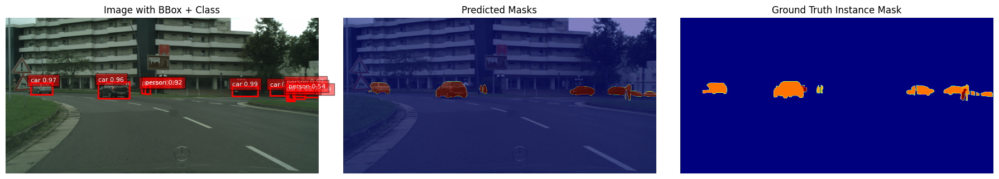

  🔹 Объект 1: [car] ✅ IoU: 0.841 | FP: 363 | FN: 33
  🔹 Объект 2: [car] ✅ IoU: 0.770 | FP: 1623 | FN: 149
  🔹 Объект 3: [car] ✅ IoU: 0.774 | FP: 898 | FN: 493
  🔹 Объект 4: [person] ✅ IoU: 0.527 | FP: 966 | FN: 564
  🔹 Объект 5: [car] ✅ IoU: 0.856 | FP: 223 | FN: 1067
  🔹 Объект 6: [car] ✅ IoU: 0.954 | FP: 467 | FN: 354
  🔹 Объект 7: [person] ✅ IoU: 0.585 | FP: 240 | FN: 136
  🔹 Объект 8: [person] ✅ IoU: 0.521 | FP: 483 | FN: 190
  🔹 Объект 9: [car] ✅ IoU: 0.644 | FP: 661 | FN: 35
  🔹 Объект 10: [car] ❌ IoU: 0.000 | FP: 2133 | FN: 0
  🔹 Объект 11: [person] ❌ IoU: 0.000 | FP: 1294 | FN: 0

📊 Сводка по изображению:
✅ Совпало объектов: 9/11 (81.8% совпадений)
📉 Средний FP: 850.1 | Средний FN: 274.6
📉 Precision: 0.817 | Recall: 0.933 | F1: 0.871

🖼️ Изображение 2/20


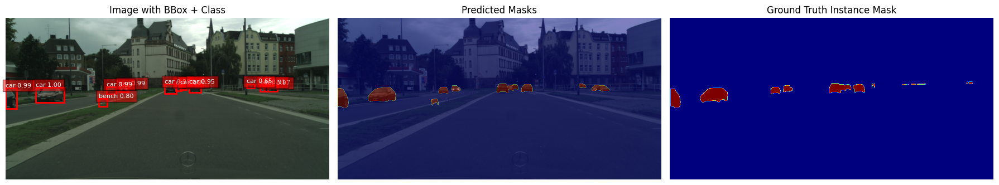

  🔹 Объект 1: [car] ✅ IoU: 0.932 | FP: 615 | FN: 267
  🔹 Объект 2: [car] ✅ IoU: 0.880 | FP: 748 | FN: 67
  🔹 Объект 3: [car] ✅ IoU: 0.881 | FP: 22 | FN: 210
  🔹 Объект 4: [car] ✅ IoU: 0.927 | FP: 46 | FN: 122
  🔹 Объект 5: [car] ✅ IoU: 0.748 | FP: 79 | FN: 217
  🔹 Объект 6: [car] ✅ IoU: 0.871 | FP: 113 | FN: 396
  🔹 Объект 7: [car] ❌ IoU: 0.000 | FP: 2233 | FN: 0
  🔹 Объект 8: [car] ✅ IoU: 0.782 | FP: 72 | FN: 182
  🔹 Объект 9: [car] ✅ IoU: 0.880 | FP: 299 | FN: 71
  🔹 Объект 10: [car] ❌ IoU: 0.000 | FP: 1244 | FN: 0
  🔹 Объект 11: [bench] ❌ IoU: 0.000 | FP: 1259 | FN: 0
  🔹 Объект 12: [car] ❌ IoU: 0.000 | FP: 1019 | FN: 0

📊 Сводка по изображению:
✅ Совпало объектов: 8/12 (66.7% совпадений)
📉 Средний FP: 645.8 | Средний FN: 127.7
📉 Precision: 0.794 | Recall: 0.951 | F1: 0.865

🖼️ Изображение 3/20


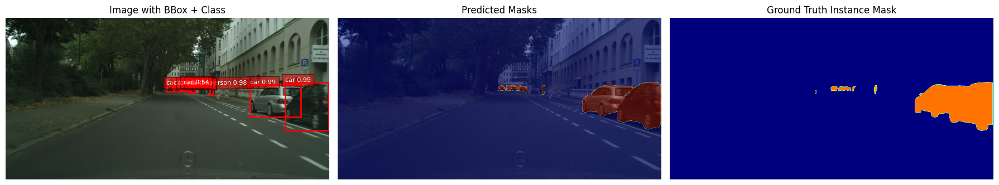

  🔹 Объект 1: [car] ✅ IoU: 0.951 | FP: 1193 | FN: 1915
  🔹 Объект 2: [car] ✅ IoU: 0.932 | FP: 829 | FN: 2050
  🔹 Объект 3: [person] ✅ IoU: 0.835 | FP: 98 | FN: 62
  🔹 Объект 4: [car] ✅ IoU: 0.802 | FP: 179 | FN: 90
  🔹 Объект 5: [car] ✅ IoU: 0.677 | FP: 402 | FN: 32
  🔹 Объект 6: [car] ❌ IoU: 0.000 | FP: 1405 | FN: 0
  🔹 Объект 7: [car] ✅ IoU: 0.561 | FP: 192 | FN: 180
  🔹 Объект 8: [car] ✅ IoU: 0.722 | FP: 76 | FN: 78
  🔹 Объект 9: [car] ❌ IoU: 0.000 | FP: 1025 | FN: 0

📊 Сводка по изображению:
✅ Совпало объектов: 7/9 (77.8% совпадений)
📉 Средний FP: 599.9 | Средний FN: 489.7
📉 Precision: 0.951 | Recall: 0.959 | F1: 0.955

🖼️ Изображение 4/20


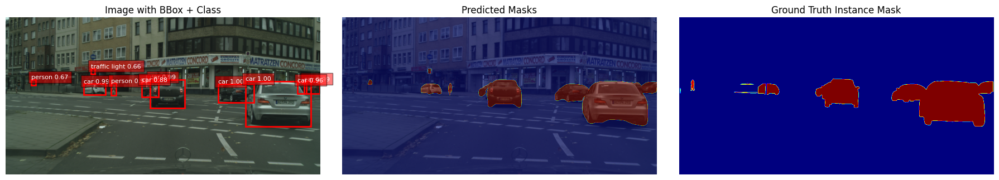

  🔹 Объект 1: [car] ✅ IoU: 0.913 | FP: 1398 | FN: 340
  🔹 Объект 2: [car] ✅ IoU: 0.939 | FP: 3038 | FN: 3391
  🔹 Объект 3: [car] ✅ IoU: 0.888 | FP: 448 | FN: 333
  🔹 Объект 4: [car] ✅ IoU: 0.924 | FP: 1834 | FN: 807
  🔹 Объект 5: [car] ✅ IoU: 0.843 | FP: 722 | FN: 563
  🔹 Объект 6: [car] ✅ IoU: 0.827 | FP: 142 | FN: 235
  🔹 Объект 7: [person] ❌ IoU: 0.000 | FP: 1441 | FN: 0
  🔹 Объект 8: [car] ✅ IoU: 0.773 | FP: 655 | FN: 82
  🔹 Объект 9: [person] ❌ IoU: 0.000 | FP: 726 | FN: 0
  🔹 Объект 10: [traffic light] ❌ IoU: 0.000 | FP: 645 | FN: 0

📊 Сводка по изображению:
✅ Совпало объектов: 7/10 (70.0% совпадений)
📉 Средний FP: 1104.9 | Средний FN: 575.1
📉 Precision: 0.938 | Recall: 0.967 | F1: 0.952

🖼️ Изображение 5/20


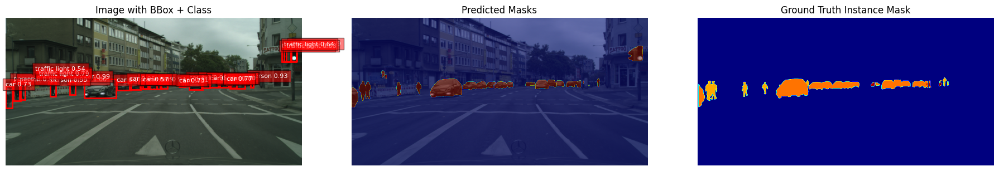

  🔹 Объект 1: [person] ✅ IoU: 0.776 | FP: 265 | FN: 186
  🔹 Объект 2: [car] ✅ IoU: 0.930 | FP: 275 | FN: 81
  🔹 Объект 3: [traffic light] ❌ IoU: 0.000 | FP: 3980 | FN: 0
  🔹 Объект 4: [car] ✅ IoU: 0.956 | FP: 505 | FN: 502
  🔹 Объект 5: [person] ✅ IoU: 0.810 | FP: 123 | FN: 783
  🔹 Объект 6: [car] ✅ IoU: 0.878 | FP: 106 | FN: 166
  🔹 Объект 7: [person] ✅ IoU: 0.795 | FP: 146 | FN: 416
  🔹 Объект 8: [person] ✅ IoU: 0.730 | FP: 468 | FN: 493
  🔹 Объект 9: [car] ✅ IoU: 0.882 | FP: 348 | FN: 194
  🔹 Объект 10: [car] ✅ IoU: 0.764 | FP: 63 | FN: 555
  🔹 Объект 11: [car] ✅ IoU: 0.850 | FP: 266 | FN: 236
  🔹 Объект 12: [car] ✅ IoU: 0.855 | FP: 87 | FN: 302
  🔹 Объект 13: [car] ✅ IoU: 0.812 | FP: 160 | FN: 141
  🔹 Объект 14: [person] ✅ IoU: 0.733 | FP: 70 | FN: 189
  🔹 Объект 15: [car] ✅ IoU: 0.912 | FP: 72 | FN: 109
  🔹 Объект 16: [car] ✅ IoU: 0.626 | FP: 278 | FN: 289
  🔹 Объект 17: [car] ✅ IoU: 0.859 | FP: 317 | FN: 192
  🔹 Объект 18: [traffic light] ❌ IoU: 0.000 | FP: 421 | FN: 0
  🔹 Объект

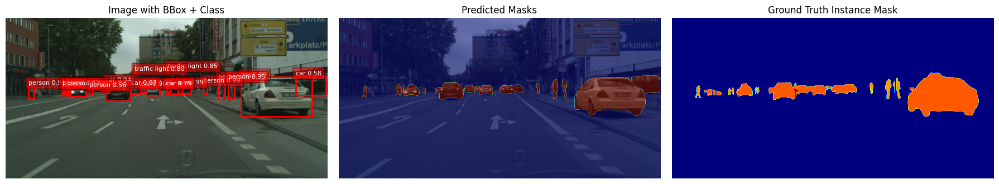

  🔹 Объект 1: [car] ✅ IoU: 0.927 | FP: 1683 | FN: 4844
  🔹 Объект 2: [person] ✅ IoU: 0.887 | FP: 227 | FN: 142
  🔹 Объект 3: [car] ✅ IoU: 0.934 | FP: 128 | FN: 181
  🔹 Объект 4: [car] ✅ IoU: 0.879 | FP: 142 | FN: 573
  🔹 Объект 5: [person] ✅ IoU: 0.818 | FP: 193 | FN: 133
  🔹 Объект 6: [person] ✅ IoU: 0.856 | FP: 54 | FN: 126
  🔹 Объект 7: [car] ✅ IoU: 0.836 | FP: 134 | FN: 393
  🔹 Объект 8: [car] ✅ IoU: 0.735 | FP: 222 | FN: 86
  🔹 Объект 9: [car] ✅ IoU: 0.778 | FP: 209 | FN: 47
  🔹 Объект 10: [car] ✅ IoU: 0.815 | FP: 744 | FN: 44
  🔹 Объект 11: [car] ✅ IoU: 0.843 | FP: 123 | FN: 368
  🔹 Объект 12: [person] ✅ IoU: 0.654 | FP: 385 | FN: 672
  🔹 Объект 13: [car] ✅ IoU: 0.891 | FP: 1423 | FN: 119
  🔹 Объект 14: [person] ❌ IoU: 0.000 | FP: 896 | FN: 0
  🔹 Объект 15: [traffic light] ❌ IoU: 0.000 | FP: 162 | FN: 0
  🔹 Объект 16: [traffic light] ❌ IoU: 0.000 | FP: 147 | FN: 0
  🔹 Объект 17: [car] ✅ IoU: 0.544 | FP: 159 | FN: 233
  🔹 Объект 18: [person] ✅ IoU: 0.644 | FP: 273 | FN: 9
  🔹 Объе

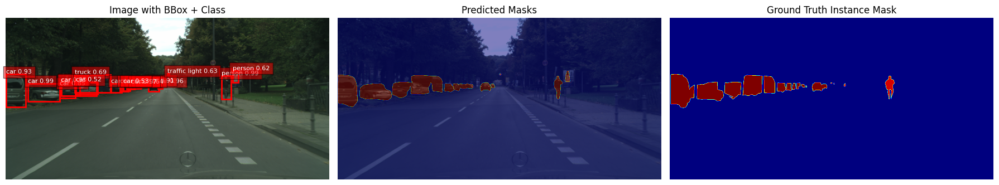

  🔹 Объект 1: [car] ✅ IoU: 0.623 | FP: 3689 | FN: 825
  🔹 Объект 2: [car] ✅ IoU: 0.798 | FP: 2556 | FN: 1160
  🔹 Объект 3: [person] ✅ IoU: 0.727 | FP: 676 | FN: 726
  🔹 Объект 4: [car] ✅ IoU: 0.778 | FP: 545 | FN: 58
  🔹 Объект 5: [car] ✅ IoU: 0.866 | FP: 30 | FN: 57
  🔹 Объект 6: [car] ✅ IoU: 0.930 | FP: 505 | FN: 1088
  🔹 Объект 7: [car] ❌ IoU: 0.000 | FP: 1236 | FN: 0
  🔹 Объект 8: [car] ❌ IoU: 0.000 | FP: 1564 | FN: 0
  🔹 Объект 9: [car] ✅ IoU: 0.883 | FP: 226 | FN: 126
  🔹 Объект 10: [car] ✅ IoU: 0.590 | FP: 712 | FN: 2606
  🔹 Объект 11: [truck] ✅ IoU: 0.766 | FP: 2841 | FN: 895
  🔹 Объект 12: [car] ❌ IoU: 0.000 | FP: 1030 | FN: 0
  🔹 Объект 13: [car] ✅ IoU: 0.505 | FP: 170 | FN: 45
  🔹 Объект 14: [traffic light] ❌ IoU: 0.000 | FP: 135 | FN: 0
  🔹 Объект 15: [person] ❌ IoU: 0.000 | FP: 1613 | FN: 0
  🔹 Объект 16: [car] ❌ IoU: 0.000 | FP: 483 | FN: 0
  🔹 Объект 17: [car] ❌ IoU: 0.000 | FP: 4916 | FN: 0
  🔹 Объект 18: [car] ✅ IoU: 0.578 | FP: 487 | FN: 37
  🔹 Объект 19: [car] ❌ IoU:

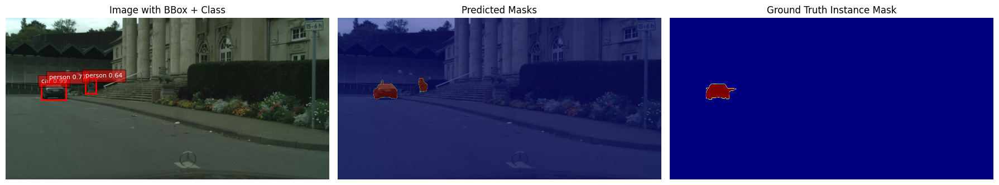

  🔹 Объект 1: [car] ✅ IoU: 0.933 | FP: 295 | FN: 541
  🔹 Объект 2: [person] ❌ IoU: 0.000 | FP: 235 | FN: 0
  🔹 Объект 3: [person] ❌ IoU: 0.000 | FP: 3600 | FN: 0

📊 Сводка по изображению:
✅ Совпало объектов: 1/3 (33.3% совпадений)
📉 Средний FP: 1376.7 | Средний FN: 180.3
📉 Precision: 0.737 | Recall: 0.955 | F1: 0.832

🖼️ Изображение 9/20


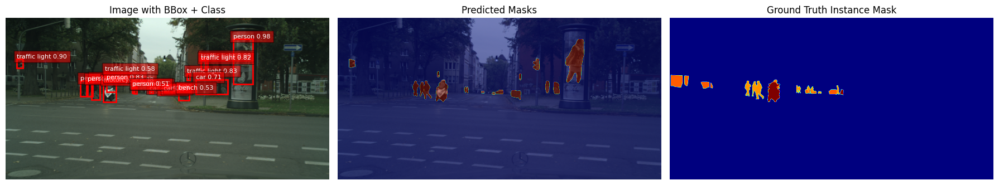

  🔹 Объект 1: [person] ✅ IoU: 0.848 | FP: 284 | FN: 93
  🔹 Объект 2: [person] ✅ IoU: 0.875 | FP: 239 | FN: 195
  🔹 Объект 3: [person] ✅ IoU: 0.764 | FP: 258 | FN: 223
  🔹 Объект 4: [person] ❌ IoU: 0.000 | FP: 20865 | FN: 0
  🔹 Объект 5: [motorcycle] ✅ IoU: 0.735 | FP: 252 | FN: 1753
  🔹 Объект 6: [car] ✅ IoU: 0.633 | FP: 110 | FN: 10
  🔹 Объект 7: [traffic light] ❌ IoU: 0.000 | FP: 2289 | FN: 0
  🔹 Объект 8: [traffic light] ❌ IoU: 0.000 | FP: 1823 | FN: 0
  🔹 Объект 9: [car] ❌ IoU: 0.000 | FP: 285 | FN: 0
  🔹 Объект 10: [person] ❌ IoU: 0.000 | FP: 2308 | FN: 0
  🔹 Объект 11: [traffic light] ❌ IoU: 0.000 | FP: 574 | FN: 0
  🔹 Объект 12: [person] ✅ IoU: 0.696 | FP: 93 | FN: 80
  🔹 Объект 13: [traffic light] ❌ IoU: 0.000 | FP: 1135 | FN: 0
  🔹 Объект 14: [car] ✅ IoU: 0.595 | FP: 0 | FN: 545
  🔹 Объект 15: [car] ❌ IoU: 0.000 | FP: 4217 | FN: 0
  🔹 Объект 16: [car] ❌ IoU: 0.000 | FP: 399 | FN: 0
  🔹 Объект 17: [traffic light] ❌ IoU: 0.000 | FP: 522 | FN: 0
  🔹 Объект 18: [bench] ❌ IoU: 0.00

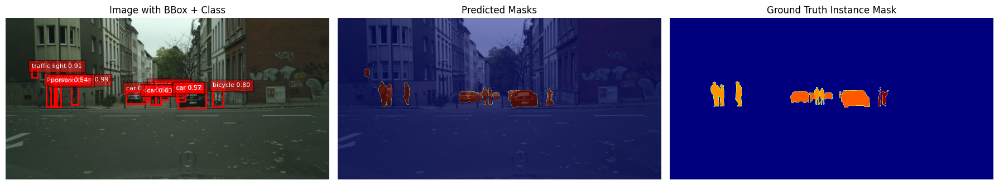

  🔹 Объект 1: [person] ✅ IoU: 0.867 | FP: 281 | FN: 133
  🔹 Объект 2: [person] ✅ IoU: 0.759 | FP: 4 | FN: 1197
  🔹 Объект 3: [person] ✅ IoU: 0.787 | FP: 237 | FN: 288
  🔹 Объект 4: [person] ✅ IoU: 0.843 | FP: 222 | FN: 741
  🔹 Объект 5: [car] ✅ IoU: 0.918 | FP: 1179 | FN: 147
  🔹 Объект 6: [person] ✅ IoU: 0.754 | FP: 861 | FN: 238
  🔹 Объект 7: [car] ✅ IoU: 0.822 | FP: 63 | FN: 310
  🔹 Объект 8: [traffic light] ✅ IoU: 0.630 | FP: 207 | FN: 514
  🔹 Объект 9: [bicycle] ❌ IoU: 0.000 | FP: 3294 | FN: 0
  🔹 Объект 10: [car] ✅ IoU: 0.514 | FP: 539 | FN: 152
  🔹 Объект 11: [car] ❌ IoU: 0.000 | FP: 868 | FN: 0
  🔹 Объект 12: [car] ✅ IoU: 0.840 | FP: 825 | FN: 506
  🔹 Объект 13: [car] ❌ IoU: 0.000 | FP: 459 | FN: 0
  🔹 Объект 14: [car] ❌ IoU: 0.000 | FP: 771 | FN: 0
  🔹 Объект 15: [car] ❌ IoU: 0.000 | FP: 1006 | FN: 0
  🔹 Объект 16: [person] ❌ IoU: 0.000 | FP: 2496 | FN: 0

📊 Сводка по изображению:
✅ Совпало объектов: 10/16 (62.5% совпадений)
📉 Средний FP: 832.0 | Средний FN: 264.1
📉 Precision:

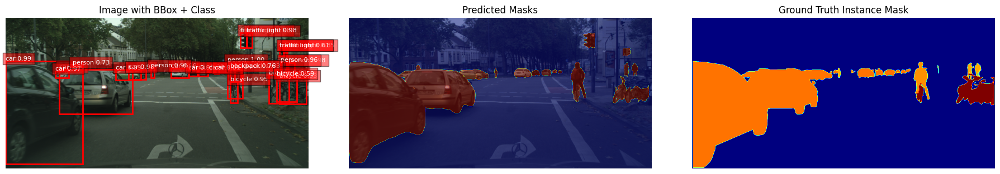

  🔹 Объект 1: [person] ✅ IoU: 0.904 | FP: 952 | FN: 398
  🔹 Объект 2: [car] ✅ IoU: 0.937 | FP: 2560 | FN: 4009
  🔹 Объект 3: [car] ✅ IoU: 0.954 | FP: 145 | FN: 137
  🔹 Объект 4: [car] ✅ IoU: 0.949 | FP: 6167 | FN: 6638
  🔹 Объект 5: [car] ✅ IoU: 0.807 | FP: 411 | FN: 53
  🔹 Объект 6: [car] ✅ IoU: 0.881 | FP: 527 | FN: 439
  🔹 Объект 7: [traffic light] ❌ IoU: 0.000 | FP: 3350 | FN: 0
  🔹 Объект 8: [traffic light] ❌ IoU: 0.000 | FP: 3364 | FN: 0
  🔹 Объект 9: [person] ✅ IoU: 0.837 | FP: 220 | FN: 232
  🔹 Объект 10: [car] ✅ IoU: 0.819 | FP: 162 | FN: 191
  🔹 Объект 11: [car] ✅ IoU: 0.874 | FP: 159 | FN: 233
  🔹 Объект 12: [car] ✅ IoU: 0.876 | FP: 257 | FN: 67
  🔹 Объект 13: [traffic light] ❌ IoU: 0.000 | FP: 1191 | FN: 0
  🔹 Объект 14: [person] ✅ IoU: 0.712 | FP: 250 | FN: 49
  🔹 Объект 15: [person] ✅ IoU: 0.685 | FP: 344 | FN: 611
  🔹 Объект 16: [car] ✅ IoU: 0.815 | FP: 38 | FN: 77
  🔹 Объект 17: [bicycle] ✅ IoU: 0.856 | FP: 232 | FN: 350
  🔹 Объект 18: [bicycle] ❌ IoU: 0.000 | FP: 8495 

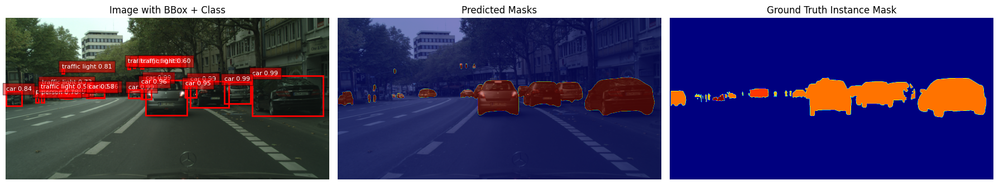

  🔹 Объект 1: [car] ✅ IoU: 0.941 | FP: 3324 | FN: 1710
  🔹 Объект 2: [car] ✅ IoU: 0.944 | FP: 1144 | FN: 661
  🔹 Объект 3: [car] ✅ IoU: 0.949 | FP: 86 | FN: 93
  🔹 Объект 4: [car] ✅ IoU: 0.912 | FP: 2104 | FN: 2309
  🔹 Объект 5: [car] ✅ IoU: 0.726 | FP: 4142 | FN: 418
  🔹 Объект 6: [car] ✅ IoU: 0.789 | FP: 200 | FN: 61
  🔹 Объект 7: [car] ✅ IoU: 0.694 | FP: 528 | FN: 471
  🔹 Объект 8: [car] ✅ IoU: 0.766 | FP: 425 | FN: 492
  🔹 Объект 9: [traffic light] ❌ IoU: 0.000 | FP: 315 | FN: 0
  🔹 Объект 10: [person] ❌ IoU: 0.000 | FP: 730 | FN: 0
  🔹 Объект 11: [traffic light] ❌ IoU: 0.000 | FP: 397 | FN: 0
  🔹 Объект 12: [car] ✅ IoU: 0.569 | FP: 119 | FN: 104
  🔹 Объект 13: [car] ✅ IoU: 0.778 | FP: 95 | FN: 1751
  🔹 Объект 14: [traffic light] ❌ IoU: 0.000 | FP: 369 | FN: 0
  🔹 Объект 15: [person] ❌ IoU: 0.000 | FP: 651 | FN: 0
  🔹 Объект 16: [truck] ✅ IoU: 0.824 | FP: 71 | FN: 1008
  🔹 Объект 17: [traffic light] ❌ IoU: 0.000 | FP: 384 | FN: 0
  🔹 Объект 18: [traffic light] ❌ IoU: 0.000 | FP: 35

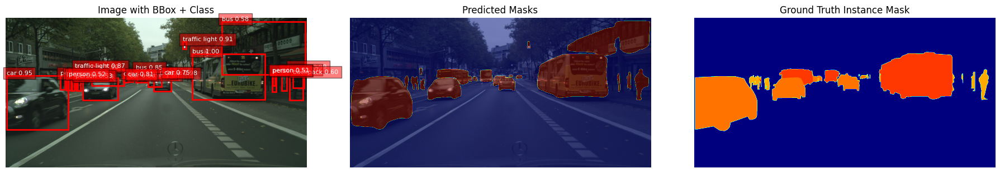

  🔹 Объект 1: [car] ✅ IoU: 0.937 | FP: 514 | FN: 1311
  🔹 Объект 2: [bus] ✅ IoU: 0.938 | FP: 354 | FN: 619
  🔹 Объект 3: [bus] ✅ IoU: 0.932 | FP: 1315 | FN: 7804
  🔹 Объект 4: [car] ✅ IoU: 0.908 | FP: 205 | FN: 630
  🔹 Объект 5: [person] ✅ IoU: 0.734 | FP: 2768 | FN: 112
  🔹 Объект 6: [person] ✅ IoU: 0.728 | FP: 305 | FN: 135
  🔹 Объект 7: [person] ✅ IoU: 0.807 | FP: 294 | FN: 46
  🔹 Объект 8: [car] ✅ IoU: 0.778 | FP: 86 | FN: 152
  🔹 Объект 9: [person] ✅ IoU: 0.652 | FP: 785 | FN: 173
  🔹 Объект 10: [car] ✅ IoU: 0.807 | FP: 465 | FN: 221
  🔹 Объект 11: [car] ✅ IoU: 0.730 | FP: 45 | FN: 276
  🔹 Объект 12: [person] ✅ IoU: 0.650 | FP: 429 | FN: 279
  🔹 Объект 13: [car] ✅ IoU: 0.930 | FP: 502 | FN: 8736
  🔹 Объект 14: [car] ❌ IoU: 0.000 | FP: 468 | FN: 0
  🔹 Объект 15: [traffic light] ❌ IoU: 0.000 | FP: 909 | FN: 0
  🔹 Объект 16: [person] ❌ IoU: 0.000 | FP: 1273 | FN: 0
  🔹 Объект 17: [traffic light] ❌ IoU: 0.000 | FP: 770 | FN: 0
  🔹 Объект 18: [bus] ✅ IoU: 0.883 | FP: 371 | FN: 438
  🔹 

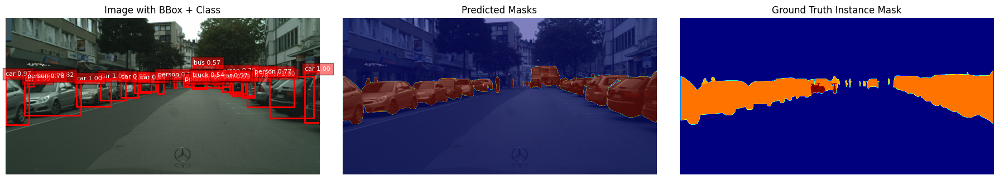

  🔹 Объект 1: [car] ✅ IoU: 0.906 | FP: 671 | FN: 713
  🔹 Объект 2: [car] ✅ IoU: 0.912 | FP: 3415 | FN: 1509
  🔹 Объект 3: [car] ✅ IoU: 0.842 | FP: 3198 | FN: 1709
  🔹 Объект 4: [car] ✅ IoU: 0.897 | FP: 2059 | FN: 346
  🔹 Объект 5: [car] ✅ IoU: 0.927 | FP: 881 | FN: 4142
  🔹 Объект 6: [car] ✅ IoU: 0.925 | FP: 350 | FN: 1833
  🔹 Объект 7: [car] ❌ IoU: 0.000 | FP: 5974 | FN: 0
  🔹 Объект 8: [car] ✅ IoU: 0.907 | FP: 346 | FN: 495
  🔹 Объект 9: [car] ✅ IoU: 0.615 | FP: 574 | FN: 1149
  🔹 Объект 10: [car] ❌ IoU: 0.000 | FP: 4773 | FN: 0
  🔹 Объект 11: [car] ✅ IoU: 0.943 | FP: 1420 | FN: 516
  🔹 Объект 12: [car] ✅ IoU: 0.867 | FP: 791 | FN: 556
  🔹 Объект 13: [person] ✅ IoU: 0.777 | FP: 113 | FN: 43
  🔹 Объект 14: [person] ✅ IoU: 0.507 | FP: 934 | FN: 406
  🔹 Объект 15: [person] ✅ IoU: 0.717 | FP: 13 | FN: 167
  🔹 Объект 16: [car] ❌ IoU: 0.000 | FP: 3008 | FN: 0
  🔹 Объект 17: [person] ❌ IoU: 0.000 | FP: 1951 | FN: 0
  🔹 Объект 18: [person] ❌ IoU: 0.000 | FP: 518 | FN: 0
  🔹 Объект 19: [perso

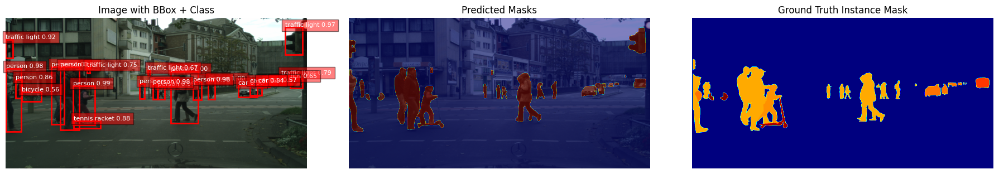

  🔹 Объект 1: [person] ✅ IoU: 0.776 | FP: 5809 | FN: 784
  🔹 Объект 2: [person] ✅ IoU: 0.843 | FP: 210 | FN: 138
  🔹 Объект 3: [person] ✅ IoU: 0.744 | FP: 4428 | FN: 910
  🔹 Объект 4: [person] ✅ IoU: 0.841 | FP: 321 | FN: 212
  🔹 Объект 5: [person] ✅ IoU: 0.850 | FP: 2620 | FN: 2722
  🔹 Объект 6: [person] ✅ IoU: 0.772 | FP: 2636 | FN: 1764
  🔹 Объект 7: [person] ✅ IoU: 0.768 | FP: 161 | FN: 358
  🔹 Объект 8: [person] ✅ IoU: 0.620 | FP: 1247 | FN: 288
  🔹 Объект 9: [person] ✅ IoU: 0.787 | FP: 1342 | FN: 2602
  🔹 Объект 10: [car] ✅ IoU: 0.846 | FP: 580 | FN: 498
  🔹 Объект 11: [person] ✅ IoU: 0.885 | FP: 154 | FN: 116
  🔹 Объект 12: [traffic light] ❌ IoU: 0.000 | FP: 14273 | FN: 0
  🔹 Объект 13: [car] ✅ IoU: 0.793 | FP: 128 | FN: 49
  🔹 Объект 14: [traffic light] ❌ IoU: 0.000 | FP: 4059 | FN: 0
  🔹 Объект 15: [car] ✅ IoU: 0.772 | FP: 63 | FN: 49
  🔹 Объект 16: [tennis racket] ❌ IoU: 0.000 | FP: 3428 | FN: 0
  🔹 Объект 17: [person] ✅ IoU: 0.593 | FP: 1078 | FN: 350
  🔹 Объект 18: [car] ✅ 

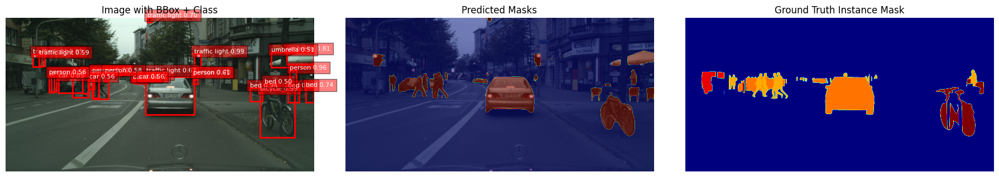

  🔹 Объект 1: [car] ✅ IoU: 0.934 | FP: 559 | FN: 3937
  🔹 Объект 2: [person] ✅ IoU: 0.700 | FP: 2301 | FN: 177
  🔹 Объект 3: [traffic light] ❌ IoU: 0.000 | FP: 3310 | FN: 0
  🔹 Объект 4: [person] ✅ IoU: 0.747 | FP: 1028 | FN: 537
  🔹 Объект 5: [bicycle] ✅ IoU: 0.587 | FP: 12254 | FN: 7254
  🔹 Объект 6: [bed] ❌ IoU: 0.000 | FP: 4287 | FN: 0
  🔹 Объект 7: [car] ✅ IoU: 0.693 | FP: 150 | FN: 234
  🔹 Объект 8: [person] ✅ IoU: 0.796 | FP: 77 | FN: 695
  🔹 Объект 9: [traffic light] ❌ IoU: 0.000 | FP: 4208 | FN: 0
  🔹 Объект 10: [bed] ❌ IoU: 0.000 | FP: 3658 | FN: 0
  🔹 Объект 11: [car] ✅ IoU: 0.571 | FP: 340 | FN: 90
  🔹 Объект 12: [car] ❌ IoU: 0.000 | FP: 880 | FN: 0
  🔹 Объект 13: [person] ✅ IoU: 0.736 | FP: 197 | FN: 497
  🔹 Объект 14: [person] ✅ IoU: 0.738 | FP: 498 | FN: 559
  🔹 Объект 15: [car] ✅ IoU: 0.691 | FP: 1689 | FN: 1344
  🔹 Объект 16: [umbrella] ❌ IoU: 0.000 | FP: 12211 | FN: 0
  🔹 Объект 17: [bed] ❌ IoU: 0.000 | FP: 3605 | FN: 0
  🔹 Объект 18: [person] ✅ IoU: 0.779 | FP: 109 |

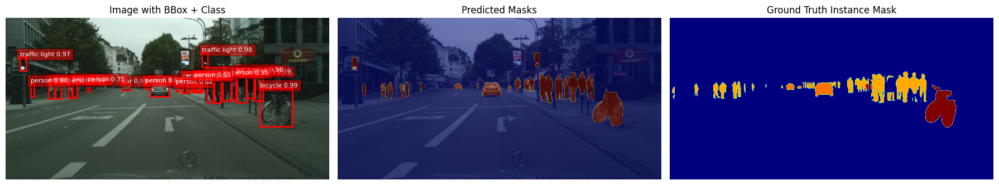

  🔹 Объект 1: [person] ✅ IoU: 0.902 | FP: 210 | FN: 50
  🔹 Объект 2: [person] ✅ IoU: 0.791 | FP: 281 | FN: 247
  🔹 Объект 3: [bicycle] ✅ IoU: 0.870 | FP: 1210 | FN: 2973
  🔹 Объект 4: [person] ✅ IoU: 0.898 | FP: 270 | FN: 602
  🔹 Объект 5: [car] ✅ IoU: 0.927 | FP: 305 | FN: 331
  🔹 Объект 6: [person] ✅ IoU: 0.830 | FP: 441 | FN: 614
  🔹 Объект 7: [car] ✅ IoU: 0.876 | FP: 35 | FN: 186
  🔹 Объект 8: [person] ✅ IoU: 0.840 | FP: 293 | FN: 604
  🔹 Объект 9: [person] ✅ IoU: 0.838 | FP: 257 | FN: 72
  🔹 Объект 10: [person] ✅ IoU: 0.506 | FP: 649 | FN: 684
  🔹 Объект 11: [person] ✅ IoU: 0.849 | FP: 556 | FN: 408
  🔹 Объект 12: [traffic light] ❌ IoU: 0.000 | FP: 2639 | FN: 0
  🔹 Объект 13: [person] ✅ IoU: 0.837 | FP: 258 | FN: 116
  🔹 Объект 14: [person] ✅ IoU: 0.697 | FP: 155 | FN: 472
  🔹 Объект 15: [person] ❌ IoU: 0.000 | FP: 6405 | FN: 0
  🔹 Объект 16: [person] ✅ IoU: 0.677 | FP: 1639 | FN: 328
  🔹 Объект 17: [traffic light] ❌ IoU: 0.000 | FP: 2819 | FN: 0
  🔹 Объект 18: [person] ✅ IoU: 0.6

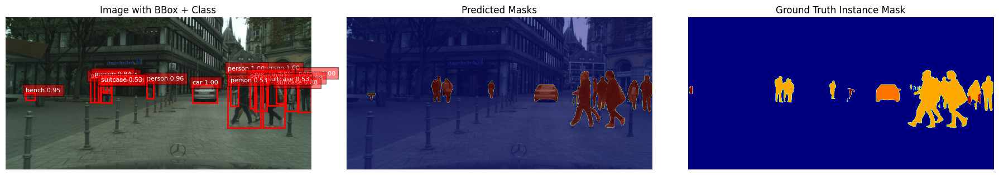

  🔹 Объект 1: [person] ✅ IoU: 0.814 | FP: 1022 | FN: 4944
  🔹 Объект 2: [person] ✅ IoU: 0.742 | FP: 5636 | FN: 2513
  🔹 Объект 3: [car] ✅ IoU: 0.934 | FP: 182 | FN: 872
  🔹 Объект 4: [person] ✅ IoU: 0.889 | FP: 1393 | FN: 128
  🔹 Объект 5: [person] ✅ IoU: 0.678 | FP: 2229 | FN: 224
  🔹 Объект 6: [person] ✅ IoU: 0.800 | FP: 1191 | FN: 852
  🔹 Объект 7: [person] ✅ IoU: 0.761 | FP: 2532 | FN: 221
  🔹 Объект 8: [person] ✅ IoU: 0.825 | FP: 305 | FN: 340
  🔹 Объект 9: [person] ❌ IoU: 0.000 | FP: 5148 | FN: 0
  🔹 Объект 10: [bench] ❌ IoU: 0.000 | FP: 1259 | FN: 0
  🔹 Объект 11: [person] ✅ IoU: 0.591 | FP: 332 | FN: 2691
  🔹 Объект 12: [person] ✅ IoU: 0.789 | FP: 554 | FN: 498
  🔹 Объект 13: [suitcase] ❌ IoU: 0.000 | FP: 3450 | FN: 0
  🔹 Объект 14: [suitcase] ❌ IoU: 0.000 | FP: 324 | FN: 0
  🔹 Объект 15: [suitcase] ❌ IoU: 0.000 | FP: 3856 | FN: 0
  🔹 Объект 16: [suitcase] ❌ IoU: 0.000 | FP: 1000 | FN: 0
  🔹 Объект 17: [person] ❌ IoU: 0.000 | FP: 2419 | FN: 0

📊 Сводка по изображению:
✅ Совпало

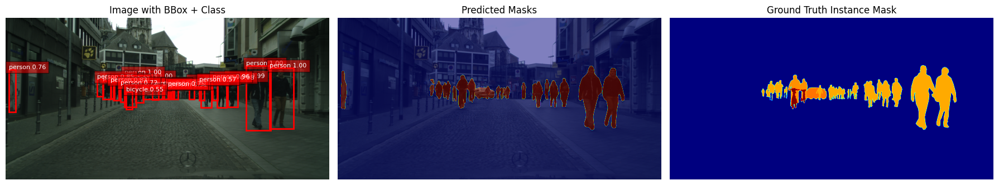

  🔹 Объект 1: [person] ✅ IoU: 0.889 | FP: 2461 | FN: 1392
  🔹 Объект 2: [person] ✅ IoU: 0.914 | FP: 1408 | FN: 1248
  🔹 Объект 3: [person] ✅ IoU: 0.797 | FP: 335 | FN: 1165
  🔹 Объект 4: [person] ✅ IoU: 0.657 | FP: 1667 | FN: 110
  🔹 Объект 5: [person] ✅ IoU: 0.637 | FP: 3067 | FN: 494
  🔹 Объект 6: [person] ✅ IoU: 0.793 | FP: 283 | FN: 100
  🔹 Объект 7: [person] ✅ IoU: 0.904 | FP: 426 | FN: 315
  🔹 Объект 8: [person] ✅ IoU: 0.913 | FP: 213 | FN: 377
  🔹 Объект 9: [person] ✅ IoU: 0.709 | FP: 310 | FN: 542
  🔹 Объект 10: [car] ✅ IoU: 0.845 | FP: 351 | FN: 715
  🔹 Объект 11: [person] ✅ IoU: 0.730 | FP: 295 | FN: 644
  🔹 Объект 12: [person] ✅ IoU: 0.750 | FP: 795 | FN: 168
  🔹 Объект 13: [person] ✅ IoU: 0.655 | FP: 61 | FN: 693
  🔹 Объект 14: [person] ✅ IoU: 0.773 | FP: 172 | FN: 270
  🔹 Объект 15: [person] ✅ IoU: 0.658 | FP: 179 | FN: 160
  🔹 Объект 16: [person] ✅ IoU: 0.650 | FP: 561 | FN: 573
  🔹 Объект 17: [person] ❌ IoU: 0.000 | FP: 1951 | FN: 0
  🔹 Объект 18: [person] ✅ IoU: 0.601 |

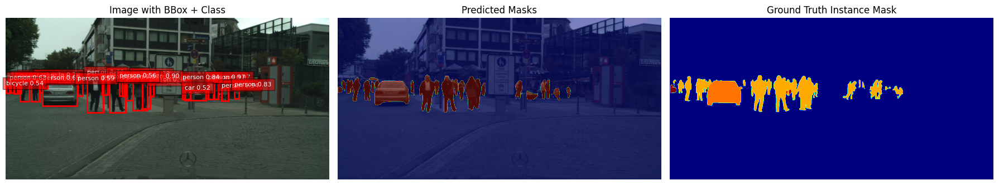

  🔹 Объект 1: [person] ✅ IoU: 0.907 | FP: 1067 | FN: 287
  🔹 Объект 2: [person] ✅ IoU: 0.907 | FP: 868 | FN: 321
  🔹 Объект 3: [person] ✅ IoU: 0.851 | FP: 1137 | FN: 739
  🔹 Объект 4: [person] ✅ IoU: 0.836 | FP: 482 | FN: 310
  🔹 Объект 5: [car] ✅ IoU: 0.926 | FP: 276 | FN: 1867
  🔹 Объект 6: [person] ✅ IoU: 0.808 | FP: 224 | FN: 759
  🔹 Объект 7: [person] ✅ IoU: 0.795 | FP: 237 | FN: 228
  🔹 Объект 8: [person] ✅ IoU: 0.759 | FP: 430 | FN: 265
  🔹 Объект 9: [person] ✅ IoU: 0.769 | FP: 205 | FN: 571
  🔹 Объект 10: [person] ✅ IoU: 0.842 | FP: 162 | FN: 446
  🔹 Объект 11: [person] ❌ IoU: 0.000 | FP: 1896 | FN: 0
  🔹 Объект 12: [person] ✅ IoU: 0.689 | FP: 199 | FN: 392
  🔹 Объект 13: [person] ✅ IoU: 0.687 | FP: 203 | FN: 556
  🔹 Объект 14: [person] ✅ IoU: 0.708 | FP: 397 | FN: 1334
  🔹 Объект 15: [person] ✅ IoU: 0.752 | FP: 307 | FN: 189
  🔹 Объект 16: [person] ✅ IoU: 0.658 | FP: 721 | FN: 836
  🔹 Объект 17: [person] ✅ IoU: 0.610 | FP: 417 | FN: 84
  🔹 Объект 18: [person] ✅ IoU: 0.574 | FP

In [5]:
def run_images(n, confidence_threshold=0.5, mask_threshold=0.5):
    """Обрабатывает n изображений, визуализирует результаты и выводит метрики"""
    
    # Цикл по n изображениям из датасета
    for img_idx in range(n):
        # Выводим номер текущего изображения
        print(f"\n🖼️ Изображение {img_idx + 1}/{n}")
        
        # Получаем изображение и ground truth маску из датасета
        img, gt_mask_pil = dataset[img_idx]
        # Переносим изображение на GPU (если доступно)
        img_gpu = img.to(device)
        # Конвертируем PIL маску в numpy массив
        gt_mask_np = np.array(gt_mask_pil)

        # Выключаем вычисление градиентов для ускорения
        with torch.no_grad():
            # Получаем предсказания модели (bounding boxes, маски, классы)
            prediction = model([img_gpu])[0]

        # Визуализируем результаты: исходное изображение, предсказания и GT маску
        visualize_all(img, prediction, gt_mask_np,
                      confidence_threshold=confidence_threshold,
                      mask_threshold=mask_threshold)

        # Вычисляем метрики качества предсказаний
        metrics = evaluate_predictions(prediction, gt_mask_np,
                                       confidence_threshold=confidence_threshold,
                                       mask_threshold=mask_threshold,
                                       iou_match_threshold=0.5)

        # Считаем общее количество объектов и количество совпадений
        total = len(metrics)
        matched = sum(1 for m in metrics if m["matched"])
        # Вычисляем среднее количество ложноположительных и ложноотрицательных пикселей
        avg_fp = np.mean([m["fp"] for m in metrics]) if metrics else 0
        avg_fn = np.mean([m["fn"] for m in metrics]) if metrics else 0

        # Выводим детальную информацию по каждому объекту
        for i, m in enumerate(metrics):
            # Получаем ID класса и его название
            label_idx = int(prediction["labels"][i])
            label_name = COCO_INSTANCE_CATEGORY_NAMES[label_idx] if label_idx < len(COCO_INSTANCE_CATEGORY_NAMES) else "N/A"
            # Выводим информацию об объекте (название, совпадение, метрики)
            print(f"  🔹 Объект {i+1}: [{label_name}] "
                  f"{'✅' if m['matched'] else '❌'} "
                  f"IoU: {m['iou']:.3f} | FP: {m['fp']} | FN: {m['fn']}")

        # Вычисляем агрегированные метрики для всего изображения
        total_tp = np.sum([m.get("tp", 0) for m in metrics])  # Общее количество True Positives
        total_fp = np.sum([m["fp"] for m in metrics])         # Общее количество False Positives
        total_fn = np.sum([m["fn"] for m in metrics])         # Общее количество False Negatives

        # Вычисляем precision (точность)
        precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0
        # Вычисляем recall (полноту)
        recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0
        # Вычисляем F1-score (гармоническое среднее precision и recall)
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

        # Выводим сводную информацию по изображению
        print(f"\n📊 Сводка по изображению:")
        print(f"✅ Совпало объектов: {matched}/{total} "
              f"({(matched / total * 100):.1f}% совпадений)")
        print(f"📉 Средний FP: {avg_fp:.1f} | Средний FN: {avg_fn:.1f}")
        print(f"📉 Precision: {precision:.3f} | Recall: {recall:.3f} | F1: {f1:.3f}")

# Запускаем обработку 20 изображений
run_images(20)

#### 2.6 Исследование параметров маски и confidence

Проведите серию экспериментов: протестируйте разные значения mask_threshold (0.3, 0.5, 0.7), протестируйте разные значения confidence_threshold, найдите оптимальное значение, при котором достигается лучший баланс между точностью и полнотой:


⚙️ Кэшируем predictions...


Inference: 100%|██████████| 20/20 [02:10<00:00,  6.51s/it]


✅ Кэш собран для 20 изображений.

🚀 Тест: confidence=0.3, mask=0.3


📈 IoU: 0.345 | Match rate: 44.69% | FP: 3428.3 | FN: 205.8 | Precision: 0.657 | Recall: 0.970 | F1: 0.784 | Total preds: 461

🚀 Тест: confidence=0.3, mask=0.4


📈 IoU: 0.353 | Match rate: 45.34% | FP: 2902.3 | FN: 300.8 | Precision: 0.691 | Recall: 0.956 | F1: 0.802 | Total preds: 461

🚀 Тест: confidence=0.3, mask=0.5


📈 IoU: 0.352 | Match rate: 45.34% | FP: 2448.7 | FN: 429.3 | Precision: 0.722 | Recall: 0.937 | F1: 0.816 | Total preds: 461

🚀 Тест: confidence=0.3, mask=0.7


📈 IoU: 0.316 | Match rate: 41.87% | FP: 1757.7 | FN: 819.2 | Precision: 0.770 | Recall: 0.878 | F1: 0.820 | Total preds: 461

🚀 Тест: confidence=0.3, mask=0.8


📈 IoU: 0.279 | Match rate: 38.61% | FP: 1459.4 | FN: 1105.7 | Precision: 0.791 | Recall: 0.833 | F1: 0.811 | Total preds: 461

🚀 Тест: confidence=0.4, mask=0.3


📈 IoU: 0.383 | Match rate: 49.13% | FP: 3529.2 | FN: 229.9 | Precision: 0.681 | Recall: 0.970 | F1: 0.801 | Total preds: 401

🚀 Тест: confidence=0.4, mask=0.4


📈 IoU: 0.392 | Match rate: 49.88% | FP: 2969.5 | FN: 338.2 | Precision: 0.715 | Recall: 0.957 | F1: 0.818 | Total preds: 401

🚀 Тест: confidence=0.4, mask=0.5


📈 IoU: 0.391 | Match rate: 49.88% | FP: 2491.3 | FN: 484.5 | Precision: 0.746 | Recall: 0.938 | F1: 0.831 | Total preds: 401

🚀 Тест: confidence=0.4, mask=0.7


📈 IoU: 0.353 | Match rate: 46.63% | FP: 1768.2 | FN: 940.1 | Precision: 0.793 | Recall: 0.878 | F1: 0.833 | Total preds: 401

🚀 Тест: confidence=0.4, mask=0.8


📈 IoU: 0.315 | Match rate: 43.64% | FP: 1465.4 | FN: 1270.7 | Precision: 0.812 | Recall: 0.833 | F1: 0.822 | Total preds: 401

🚀 Тест: confidence=0.5, mask=0.3


📈 IoU: 0.419 | Match rate: 53.48% | FP: 3392.6 | FN: 254.4 | Precision: 0.713 | Recall: 0.971 | F1: 0.822 | Total preds: 359

🚀 Тест: confidence=0.5, mask=0.4


📈 IoU: 0.429 | Match rate: 54.32% | FP: 2813.9 | FN: 374.9 | Precision: 0.747 | Recall: 0.957 | F1: 0.839 | Total preds: 359

🚀 Тест: confidence=0.5, mask=0.5


📈 IoU: 0.428 | Match rate: 54.32% | FP: 2325.6 | FN: 537.8 | Precision: 0.778 | Recall: 0.938 | F1: 0.850 | Total preds: 359

🚀 Тест: confidence=0.5, mask=0.7


📈 IoU: 0.389 | Match rate: 51.25% | FP: 1604.0 | FN: 1046.7 | Precision: 0.825 | Recall: 0.878 | F1: 0.850 | Total preds: 359

🚀 Тест: confidence=0.5, mask=0.8


📈 IoU: 0.346 | Match rate: 47.63% | FP: 1309.1 | FN: 1413.7 | Precision: 0.844 | Recall: 0.833 | F1: 0.839 | Total preds: 359

🚀 Тест: confidence=0.6, mask=0.3


📈 IoU: 0.454 | Match rate: 57.76% | FP: 2892.4 | FN: 282.2 | Precision: 0.764 | Recall: 0.971 | F1: 0.855 | Total preds: 322

🚀 Тест: confidence=0.6, mask=0.4


📈 IoU: 0.466 | Match rate: 58.70% | FP: 2331.6 | FN: 415.8 | Precision: 0.799 | Recall: 0.957 | F1: 0.871 | Total preds: 322

🚀 Тест: confidence=0.6, mask=0.5


📈 IoU: 0.465 | Match rate: 58.70% | FP: 1862.9 | FN: 596.3 | Precision: 0.830 | Recall: 0.938 | F1: 0.881 | Total preds: 322

🚀 Тест: confidence=0.6, mask=0.7


📈 IoU: 0.426 | Match rate: 55.90% | FP: 1192.3 | FN: 1165.8 | Precision: 0.876 | Recall: 0.878 | F1: 0.877 | Total preds: 322

🚀 Тест: confidence=0.6, mask=0.8


📈 IoU: 0.382 | Match rate: 52.48% | FP: 926.3 | FN: 1575.1 | Precision: 0.895 | Recall: 0.833 | F1: 0.863 | Total preds: 322

🚀 Тест: confidence=0.7, mask=0.3


📈 IoU: 0.503 | Match rate: 63.27% | FP: 2841.0 | FN: 308.7 | Precision: 0.789 | Recall: 0.972 | F1: 0.871 | Total preds: 275

🚀 Тест: confidence=0.7, mask=0.4


📈 IoU: 0.515 | Match rate: 64.00% | FP: 2272.0 | FN: 459.6 | Precision: 0.822 | Recall: 0.958 | F1: 0.885 | Total preds: 275

🚀 Тест: confidence=0.7, mask=0.5


📈 IoU: 0.512 | Match rate: 63.64% | FP: 1806.0 | FN: 664.2 | Precision: 0.851 | Recall: 0.939 | F1: 0.893 | Total preds: 275

🚀 Тест: confidence=0.7, mask=0.7


📈 IoU: 0.471 | Match rate: 61.09% | FP: 1154.5 | FN: 1314.9 | Precision: 0.892 | Recall: 0.879 | F1: 0.885 | Total preds: 275

🚀 Тест: confidence=0.7, mask=0.8


📈 IoU: 0.426 | Match rate: 58.18% | FP: 913.3 | FN: 1788.3 | Precision: 0.907 | Recall: 0.833 | F1: 0.869 | Total preds: 275

🚀 Тест: confidence=0.75, mask=0.3


📈 IoU: 0.523 | Match rate: 65.52% | FP: 2720.4 | FN: 311.3 | Precision: 0.804 | Recall: 0.973 | F1: 0.880 | Total preds: 261

🚀 Тест: confidence=0.75, mask=0.4


📈 IoU: 0.536 | Match rate: 66.28% | FP: 2176.1 | FN: 469.4 | Precision: 0.835 | Recall: 0.959 | F1: 0.893 | Total preds: 261

🚀 Тест: confidence=0.75, mask=0.5


📈 IoU: 0.537 | Match rate: 66.67% | FP: 1713.7 | FN: 696.8 | Precision: 0.863 | Recall: 0.939 | F1: 0.900 | Total preds: 261

🚀 Тест: confidence=0.75, mask=0.7


📈 IoU: 0.491 | Match rate: 63.60% | FP: 1107.8 | FN: 1380.2 | Precision: 0.900 | Recall: 0.879 | F1: 0.889 | Total preds: 261

🚀 Тест: confidence=0.75, mask=0.8


📈 IoU: 0.444 | Match rate: 60.54% | FP: 882.1 | FN: 1876.7 | Precision: 0.914 | Recall: 0.834 | F1: 0.872 | Total preds: 261

🚀 Тест: confidence=0.8, mask=0.3


📈 IoU: 0.552 | Match rate: 69.01% | FP: 2742.7 | FN: 334.5 | Precision: 0.814 | Recall: 0.973 | F1: 0.887 | Total preds: 242

🚀 Тест: confidence=0.8, mask=0.4


📈 IoU: 0.563 | Match rate: 69.42% | FP: 2174.8 | FN: 504.1 | Precision: 0.845 | Recall: 0.959 | F1: 0.899 | Total preds: 242

🚀 Тест: confidence=0.8, mask=0.5


📈 IoU: 0.564 | Match rate: 69.83% | FP: 1694.9 | FN: 748.3 | Precision: 0.873 | Recall: 0.940 | F1: 0.905 | Total preds: 242

🚀 Тест: confidence=0.8, mask=0.7


📈 IoU: 0.518 | Match rate: 66.94% | FP: 1079.2 | FN: 1482.8 | Precision: 0.909 | Recall: 0.879 | F1: 0.894 | Total preds: 242

🚀 Тест: confidence=0.8, mask=0.8


📈 IoU: 0.469 | Match rate: 63.64% | FP: 854.9 | FN: 2016.2 | Precision: 0.922 | Recall: 0.834 | F1: 0.876 | Total preds: 242

🚀 Тест: confidence=0.85, mask=0.3


📈 IoU: 0.589 | Match rate: 73.64% | FP: 2668.0 | FN: 359.3 | Precision: 0.832 | Recall: 0.973 | F1: 0.897 | Total preds: 220

🚀 Тест: confidence=0.85, mask=0.4


📈 IoU: 0.601 | Match rate: 74.09% | FP: 2095.1 | FN: 544.3 | Precision: 0.861 | Recall: 0.960 | F1: 0.908 | Total preds: 220

🚀 Тест: confidence=0.85, mask=0.5


📈 IoU: 0.603 | Match rate: 74.55% | FP: 1615.8 | FN: 811.3 | Precision: 0.888 | Recall: 0.940 | F1: 0.913 | Total preds: 220

🚀 Тест: confidence=0.85, mask=0.7


📈 IoU: 0.552 | Match rate: 70.91% | FP: 1042.3 | FN: 1612.9 | Precision: 0.919 | Recall: 0.880 | F1: 0.899 | Total preds: 220

🚀 Тест: confidence=0.85, mask=0.8


📈 IoU: 0.501 | Match rate: 67.73% | FP: 842.0 | FN: 2196.9 | Precision: 0.929 | Recall: 0.835 | F1: 0.880 | Total preds: 220

🚀 Тест: confidence=0.9, mask=0.3


📈 IoU: 0.613 | Match rate: 76.29% | FP: 2791.0 | FN: 389.4 | Precision: 0.841 | Recall: 0.974 | F1: 0.902 | Total preds: 194

🚀 Тест: confidence=0.9, mask=0.4


📈 IoU: 0.626 | Match rate: 76.80% | FP: 2170.4 | FN: 592.0 | Precision: 0.870 | Recall: 0.961 | F1: 0.913 | Total preds: 194

🚀 Тест: confidence=0.9, mask=0.5


📈 IoU: 0.630 | Match rate: 77.32% | FP: 1679.1 | FN: 885.7 | Precision: 0.894 | Recall: 0.941 | F1: 0.917 | Total preds: 194

🚀 Тест: confidence=0.9, mask=0.7


📈 IoU: 0.584 | Match rate: 74.74% | FP: 1066.5 | FN: 1790.2 | Precision: 0.925 | Recall: 0.881 | F1: 0.902 | Total preds: 194

🚀 Тест: confidence=0.9, mask=0.8


📈 IoU: 0.531 | Match rate: 71.65% | FP: 876.1 | FN: 2440.8 | Precision: 0.934 | Recall: 0.836 | F1: 0.882 | Total preds: 194

🚀 Тест: confidence=0.95, mask=0.3


📈 IoU: 0.667 | Match rate: 81.94% | FP: 2709.9 | FN: 403.2 | Precision: 0.863 | Recall: 0.977 | F1: 0.916 | Total preds: 155

🚀 Тест: confidence=0.95, mask=0.4


📈 IoU: 0.682 | Match rate: 82.58% | FP: 2064.9 | FN: 623.9 | Precision: 0.891 | Recall: 0.964 | F1: 0.926 | Total preds: 155

🚀 Тест: confidence=0.95, mask=0.5


📈 IoU: 0.687 | Match rate: 83.23% | FP: 1561.5 | FN: 949.5 | Precision: 0.914 | Recall: 0.946 | F1: 0.929 | Total preds: 155

🚀 Тест: confidence=0.95, mask=0.7


📈 IoU: 0.645 | Match rate: 81.94% | FP: 954.7 | FN: 1992.6 | Precision: 0.942 | Recall: 0.885 | F1: 0.913 | Total preds: 155

🚀 Тест: confidence=0.95, mask=0.8


📈 IoU: 0.585 | Match rate: 78.06% | FP: 810.6 | FN: 2721.8 | Precision: 0.947 | Recall: 0.842 | F1: 0.891 | Total preds: 155

📋 Таблица результатов:


,confidence_threshold,mask_threshold,avg_iou,avg_fp,avg_fn,match_rate,total_preds,precision,recall,f1
0,0.30,0.3,0.344763,3428.279826,205.796095,0.446855,461,0.657434,0.969670,0.783593
1,0.30,0.4,0.353026,2902.301518,300.796095,0.453362,461,0.691124,0.955732,0.802170
2,0.30,0.5,0.352201,2448.715835,429.301518,0.453362,461,0.722127,0.936802,0.815574
3,0.30,0.7,0.315656,1757.704989,819.245119,0.418655,461,0.769902,0.877734,0.820289
4,0.30,0.8,0.278793,1459.449024,1105.685466,0.386117,461,0.790728,0.832982,0.811305
5,0.40,0.3,0.382568,3529.224439,229.910224,0.491272,401,0.681265,0.970423,0.800533
6,0.40,0.4,0.391814,2969.453865,338.182045,0.498753,401,0.714905,0.956556,0.818263
7,0.40,0.5,0.390755,2491.256858,484.491272,0.498753,401,0.745504,0.937744,0.830647
8,0.40,0.7,0.353310,1768.246883,940.124688,0.466334,401,0.792593,0.877864,0.833052
9,0.40,0.8,0.315359,1465.371571,1270.678304,0.436409,401,0.812216,0.832999,0.822477


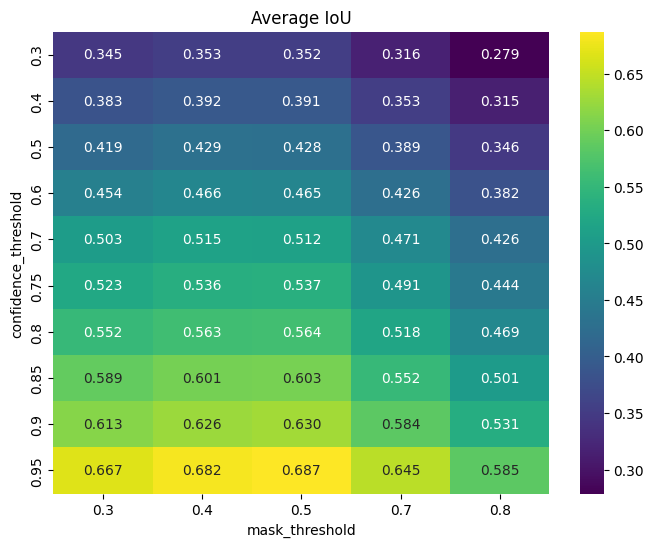

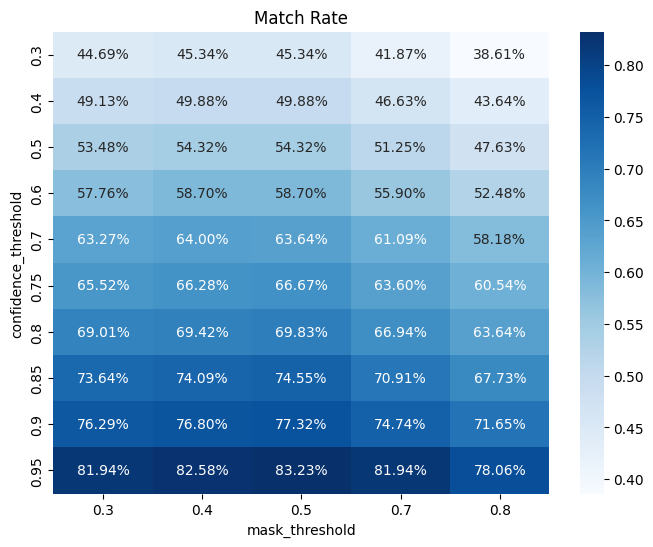

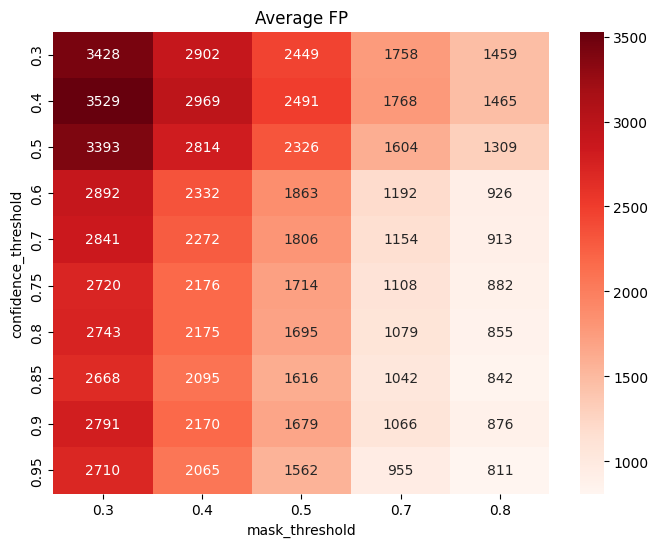

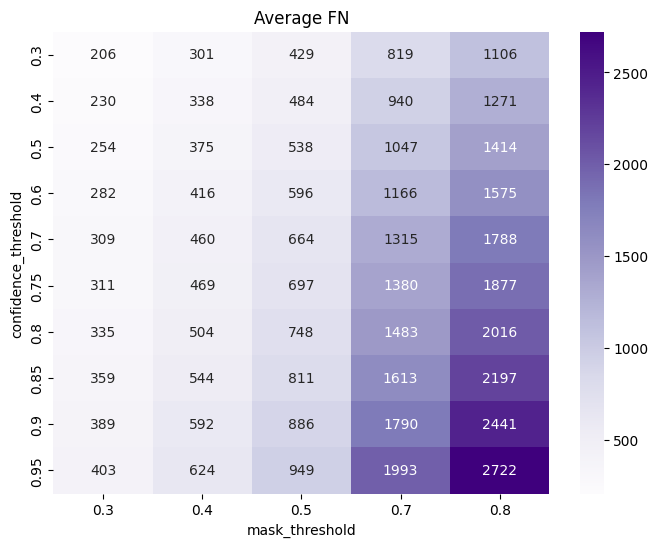

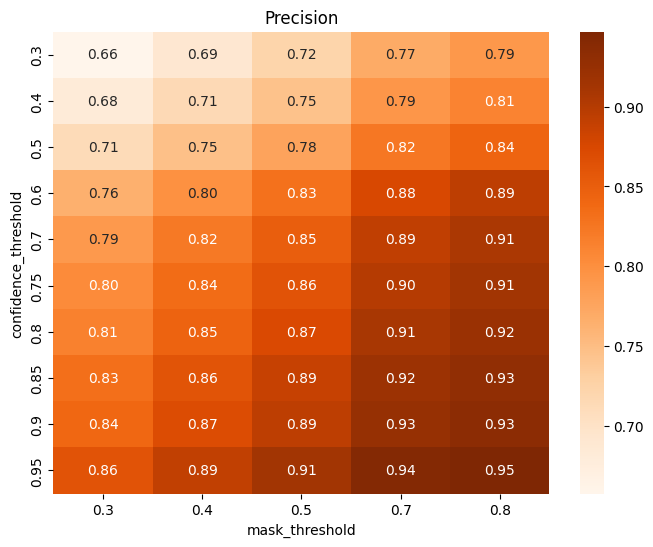

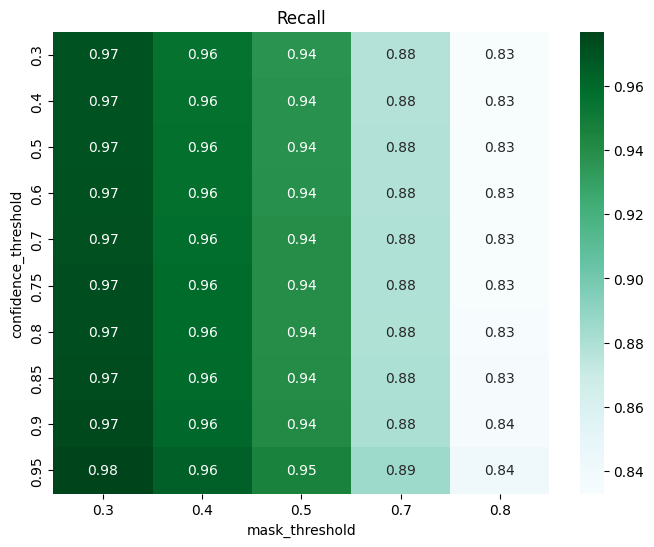

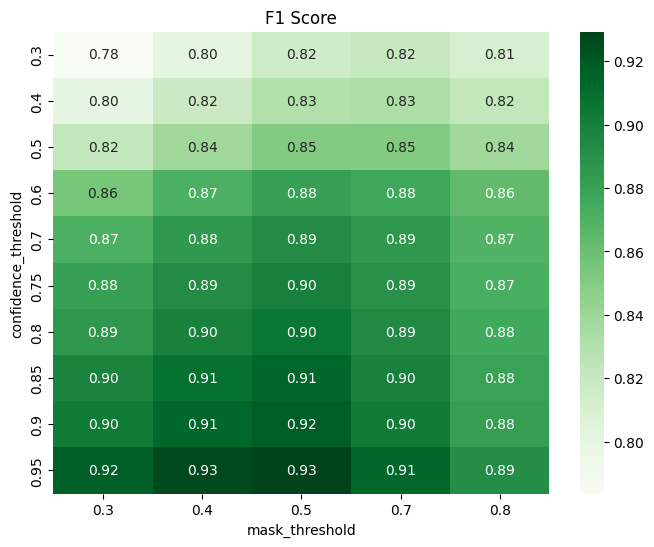

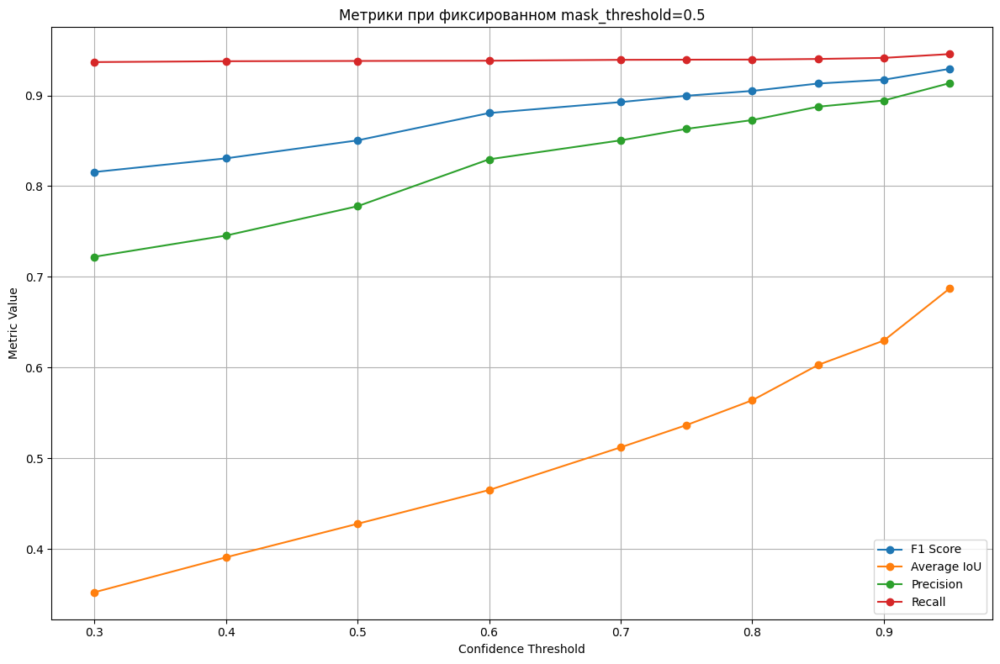

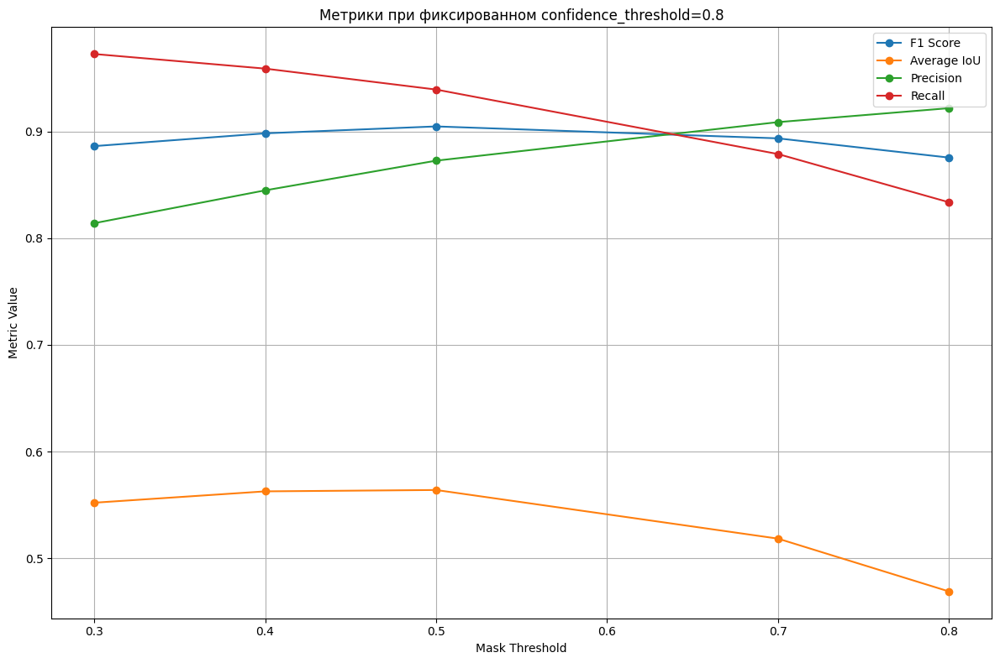

In [6]:
def get_random_indices(dataset, n=20, seed=42):
    """Генерирует список случайных индексов из датасета"""
    # Фиксируем seed для воспроизводимости
    random.seed(seed)
    # Создаем список всех возможных индексов
    indices = list(range(len(dataset)))
    # Возвращаем n случайно выбранных индексов
    return random.sample(indices, n)

# Глобальный кэш для хранения предсказаний модели
inference_cache = {}

def build_inference_cache(indices):
    """Строит кэш предсказаний модели для указанных индексов"""
    print("⚙️ Кэшируем predictions...")
    # Обрабатываем каждое изображение с прогресс-баром
    for idx in tqdm(indices, desc="Inference"):
        # Получаем изображение и маску из датасета
        img, gt_mask_pil = dataset[idx]
        # Переносим изображение на GPU
        img_gpu = img.to(device)
        # Конвертируем PIL маску в numpy массив
        gt_mask_np = np.array(gt_mask_pil)

        # Выключаем вычисление градиентов для ускорения
        with torch.no_grad():
            # Получаем предсказания модели
            prediction = model([img_gpu])[0]

        # Получаем уникальные ID объектов в GT маске (исключаем фон)
        gt_ids = np.unique(gt_mask_np)
        gt_ids = gt_ids[gt_ids > 0]
        # Создаем бинарные маски для каждого объекта
        gt_binary_masks = [(gt_mask_np == inst_id).astype(np.uint8) for inst_id in gt_ids]

        # Конвертируем предсказания в CPU формат
        prediction_cpu = {
            "masks": [m[0].cpu().numpy().astype(np.float32) for m in prediction["masks"]],
            "labels": prediction["labels"].cpu(),
            "scores": prediction["scores"].cpu()
        }

        # Сохраняем в кэш изображение, GT маски и предсказания
        inference_cache[idx] = (img.cpu(), gt_binary_masks, prediction_cpu)

    print(f"✅ Кэш собран для {len(inference_cache)} изображений.")

def evaluate_predictions(prediction, gt_binary_masks,
                         confidence_threshold=0.5,
                         mask_threshold=0.5,
                         iou_match_threshold=0.5):
    """Оценивает предсказания модели по сравнению с GT масками"""
    metrics = []
    matched_gt = set()  # Для отслеживания сопоставленных GT масок

    # Оцениваем каждое предсказание модели
    for i in range(len(prediction["masks"])):
        # Пропускаем предсказания с низкой уверенностью
        if prediction["scores"][i] < confidence_threshold:
            continue

        # Бинаризуем предсказанную маску по порогу
        pred_bin = (prediction["masks"][i] > mask_threshold).astype(np.uint8)

        best_iou = 0
        best_gt_idx = -1

        # Ищем GT маску с максимальным IoU
        for j, gt_bin in enumerate(gt_binary_masks):
            # Пропускаем уже сопоставленные GT маски
            if j in matched_gt:
                continue

            # Вычисляем IoU
            inter = np.logical_and(pred_bin, gt_bin).sum()
            union = np.logical_or(pred_bin, gt_bin).sum()
            iou = inter / union if union > 0 else 0

            if iou > best_iou:
                best_iou = iou
                best_gt_idx = j

        # Если нашли подходящую GT маску
        if best_iou >= iou_match_threshold and best_gt_idx != -1:
            matched_gt.add(best_gt_idx)
            # Вычисляем FP, FN, TP
            fp = np.logical_and(pred_bin, 1 - gt_binary_masks[best_gt_idx]).sum()
            fn = np.logical_and(1 - pred_bin, gt_binary_masks[best_gt_idx]).sum()
            tp = np.logical_and(pred_bin, gt_binary_masks[best_gt_idx]).sum()
            metrics.append({"matched": True, "iou": best_iou, "fp": fp, "fn": fn, "tp": tp})
        else:
            # Если не нашли подходящую GT маску
            fp = pred_bin.sum()
            metrics.append({"matched": False, "iou": 0.0, "fp": fp, "fn": 0, "tp": 0})

    return metrics

def run_threshold_experiments(indices,
                              confidence_values=[0.3, 0.5, 0.7],
                              mask_values=[0.3, 0.5, 0.7]):
    """Запускает эксперименты с разными пороговыми значениями"""
    results = []

    # Перебираем все комбинации порогов
    for conf_th in confidence_values:
        for mask_th in mask_values:
            print(f"\n🚀 Тест: confidence={conf_th}, mask={mask_th}")

            all_iou = []
            all_fp = []
            all_fn = []
            all_tp = []
            matched_total = 0
            pred_total = 0

            # Оцениваем все изображения с текущими порогами
            for idx in tqdm(indices, desc=f"conf={conf_th}, mask={mask_th}", leave=False):
                img, gt_masks, prediction = inference_cache[idx]

                metrics = evaluate_predictions(
                    prediction, gt_masks,
                    confidence_threshold=conf_th,
                    mask_threshold=mask_th,
                    iou_match_threshold=0.5
                )

                pred_total += len(metrics)
                matched_total += sum(1 for m in metrics if m["matched"])
                all_iou.extend([m["iou"] for m in metrics])
                all_fp.extend([m["fp"] for m in metrics])
                all_fn.extend([m["fn"] for m in metrics])
                all_tp.extend([m.get("tp", 0) for m in metrics])

            # Вычисляем средние метрики
            avg_iou = np.mean(all_iou) if all_iou else 0
            avg_fp = np.mean(all_fp) if all_fp else 0
            avg_fn = np.mean(all_fn) if all_fn else 0
            match_rate = matched_total / pred_total if pred_total > 0 else 0

            # Вычисляем агрегированные метрики
            total_tp = np.sum(all_tp)
            total_fp = np.sum(all_fp)
            total_fn = np.sum(all_fn)

            precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0
            recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0
            f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

            # Сохраняем результаты
            result = {
                "confidence_threshold": conf_th,
                "mask_threshold": mask_th,
                "avg_iou": avg_iou,
                "avg_fp": avg_fp,
                "avg_fn": avg_fn,
                "match_rate": match_rate,
                "total_preds": pred_total,
                "precision": precision,
                "recall": recall,
                "f1": f1
            }
            print(f"📈 IoU: {avg_iou:.3f} | "
                  f"Match rate: {match_rate:.2%} | "
                  f"FP: {avg_fp:.1f} | FN: {avg_fn:.1f} | "
                  f"Precision: {precision:.3f} | Recall: {recall:.3f} | "
                  f"F1: {f1:.3f} | Total preds: {pred_total}")

            results.append(result)

    return results

def visualize_experiment_results(results):
    """Визуализирует результаты экспериментов"""
    df = pd.DataFrame(results)

    print("\n📋 Таблица результатов:")
    display(df)

    # Создаем heatmap'ы для различных метрик
    metrics = [
        ("avg_iou", "Average IoU", "viridis", ".3f"),
        ("match_rate", "Match Rate", "Blues", ".2%"),
        ("avg_fp", "Average FP", "Reds", ".0f"),
        ("avg_fn", "Average FN", "Purples", ".0f"),
        ("precision", "Precision", "Oranges", ".2f"),
        ("recall", "Recall", "BuGn", ".2f"),
        ("f1", "F1 Score", "Greens", ".2f")
    ]

    for metric, title, cmap, fmt in metrics:
        pivot = df.pivot(index="confidence_threshold", columns="mask_threshold", values=metric)
        plt.figure(figsize=(8, 6))
        sns.heatmap(pivot, annot=True, fmt=fmt, cmap=cmap)
        plt.title(title)
        plt.show()

def plot_metric_vs_threshold(df, fixed_param="mask_threshold", fixed_value=0.5):
    """
    Рисует зависимости метрик от одного из порогов, при фиксированном значении другого.
    fixed_param: 'mask_threshold' или 'confidence_threshold'
    fixed_value: фиксируемое значение
    """
    assert fixed_param in ["mask_threshold", "confidence_threshold"]

    # Фильтруем данные по фиксированному параметру
    df_filtered = df[df[fixed_param] == fixed_value].sort_values(
        by="confidence_threshold" if fixed_param == "mask_threshold" else "mask_threshold")
    
    # Определяем ось X в зависимости от фиксированного параметра
    x = df_filtered["confidence_threshold"] if fixed_param == "mask_threshold" else df_filtered["mask_threshold"]

    metrics = ["f1", "avg_iou", "precision", "recall"]
    titles = ["F1 Score", "Average IoU", "Precision", "Recall"]

    # Строим графики
    plt.figure(figsize=(12, 8))
    for i, metric in enumerate(metrics):
        plt.plot(x, df_filtered[metric], label=titles[i], marker='o')

    xlabel = "Confidence Threshold" if fixed_param == "mask_threshold" else "Mask Threshold"
    plt.xlabel(xlabel)
    plt.ylabel("Metric Value")
    plt.title(f"Метрики при фиксированном {fixed_param}={fixed_value}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Основной процесс выполнения:
# 1. Выбираем случайные 20 изображений
sample_indices = get_random_indices(dataset, n=20)
# 2. Строим кэш предсказаний для этих изображений
build_inference_cache(sample_indices)

# 3. Запускаем эксперименты с разными порогами
experiment_results = run_threshold_experiments(
    sample_indices,
    confidence_values = [0.3, 0.4, 0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95],
    mask_values=[0.3, 0.4, 0.5, 0.7, 0.8]
)
# experiment_results = run_threshold_experiments(
#      sample_indices,
#      confidence_values=[0.5, 0.9, 0.8],
#      mask_values=[0.5, 0.9]
#  )

# 4. Визуализируем результаты
visualize_experiment_results(experiment_results)

# 5. Строим графики зависимостей метрик от порогов
df = pd.DataFrame(experiment_results)
plot_metric_vs_threshold(df, fixed_param="mask_threshold", fixed_value=0.5)
plot_metric_vs_threshold(df, fixed_param="confidence_threshold", fixed_value=0.8)